*UIDs:*

1. 119 385 173 (Anh N. Nhu)

2. 117 863 239 (Ansh Viswanathan)

3. 118 007 359 (Kamal Narra)

4. 117 127 522 (Nimay Vyas)

# **CMSC426 Final Project: Depth and Contact Prediction**

## Objective

In this project we want to use deep neural networks to predict 3D contact geometry from monocular images of a vision-based tactile sensor.

# Background

  - **Tactile sensors** are devices designed to measure information arising from the physical interaction of robots with their environment. These sensors excel in detecting stimuli resulting from mechanical stimulation, temperature variations, and even pain-like responses.
<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1dBNV2bzJVY4bS70TljKFSjzn7X40vY70" alt="Digit on allgero" width="450"/>
</p>
However, recent sensor developments in this field, often inspired by the biological sense of cutaneous touch, have predominantly concentrated on capturing the 3D geometry of contact. In this project, we aim to extend this focus to predicting such interactions, particularly for GelSight tactile sensors. The figure below illustrates the resolution of tactile sensors when they come into contact with various objects
<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1JtePPB9wisU5XdIZ56P_Omo_84QZmFGk" alt="Digit images"/>
</p>
The papers below contain crucial information on how these sensors work, which could be helpful for success in this project <br>
<a href="http://gelsight.csail.mit.edu/wedge/ICRA2021_Wedge.pdf"> GelSight Wedge: Measuring High-Resolution 3D Contact Geometry with a Compact Robot Finger</a><br>
<a href="https://arxiv.org/pdf/2005.14679.pdf">DIGIT: A Novel Design for a Low-Cost Compact
High-Resolution Tactile Sensor with Application to
In-Hand Manipulation</a>

- **Depth Prediction** is the task of measuring the distance of each pixel relative to the camera. Depth is extracted from either monocular (single) or stereo (multiple views of a scene) images. Traditional methods use multi-view geometry to find the relationship between the images. Newer methods can directly estimate depth by minimizing the regression loss, or by learning to generate a novel view from a sequence. *You can also watch one of the recent works in PRG on reconstructing objects with tactile sensors on [YouTube](https://www.youtube.com/watch?v=38utg590wao)*.

- **Contact Prediction** is closely akin to Depth Prediction but represents a somewhat simpler task. This is because the output solely consists of a binary mask indicating the areas where the depth is positive.


## Objective
In this project, we aim to acquire the inverse sensor model to reconstruct local 3D geometry from a tactile image. The task involves training the model in a supervised manner to predict local heightmaps and contact areas from tactile images. While one potential strategy involves integrating depth and contact prediction within a stacked neural network, such as outlined in [Depth Map Prediction from a Single Image using a Multi-Scale Deep Network](https://arxiv.org/pdf/1406.2283.pdf), we encourage you to propose a novel approach tailored to the specific challenges of the problem. Nevertheless, we'll provide you with a project template to guide your implementation, building upon the principles covered during semester.

**IN THIS PROJECT ALL FUNCTIONS/LIBRARIES ARE ALLOWED**

### Step 1: Dataloading
Create a custom dataset to read images from the [provided dataset](https://drive.google.com/drive/folders/16BcGTVkj4s0y9kWM9vIFo40MdPjRRv7L?usp=drive_link). You might need to preprocess the data as these are raw tactile readings from sensor without any normalization. For further guidance, refer to the [PyTorch tutorial](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html).

In [1]:
# Download the dataset
import os
if not os.path.exists('mini_depth_dataset'):
    !wget https://shorturl.at/ayEOY
    !unzip ayEOY

#### Step 1.1: Create separate folders for Train & Validation images

In [2]:
import os
import sys
import shutil
from tqdm import tqdm

In [3]:
"""# Split train-val-test set based on different objects"""

""" SPLIT 1"""
# train_objects = ['big_decagon', 'cables', 'cube', 'digit_mount', 'hafez']
# valid_objects = ['long_cylinder', 'med_decagon', 'ring']
""" SPLIT 2"""
train_objects = ['big_decagon', 'cables', 'cube', 'digit_mount', 'hafez', 'ring']
valid_objects = ['long_cylinder', 'med_decagon']
""" SPLIT 4"""
# train_objects = ['med_decagon', 'big_decagon', 'cables', 'cube', 'digit_mount', 'hafez', 'ring', 'long_cylinder']
# valid_objects = ['long_cylinder', 'ring', 'hafez', 'digit_mount']

if os.path.exists('trainset'):
    os.system('rm -rf trainset')
    os.system('rm -rf valset')
    
    cwd = os.getcwd()
    os.system('mkdir -p trainset')
    os.system('mkdir -p trainset/depth')
    os.system('mkdir -p trainset/tactile')
    os.system('mkdir -p valset')
    os.system('mkdir -p valset/depth')
    os.system('mkdir -p valset/tactile')
    
""" Explicitly copy train & validation images to 2 different folders"""
# Copy Train Images
for obj_name in tqdm(train_objects, desc='creating training folder'):
    obj_dir = os.path.join(cwd, f'mini_depth_dataset/{obj_name}')

    # copy `depth` images for current object
    os.chdir(obj_dir)
    os.chdir('depth')
    for img_name in os.listdir('.'):
        new_img_name = f'{obj_name}_{img_name}'
        shutil.copy(img_name, os.path.join(cwd, f'trainset/depth/{new_img_name}'))

    # copy `depth` images for current object
    os.chdir(obj_dir)
    os.chdir('tactile')
    for img_name in os.listdir('.'):
        new_img_name = f'{obj_name}_{img_name}'
        shutil.copy(img_name, os.path.join(cwd, f'trainset/tactile/{new_img_name}'))

    os.chdir(cwd)

# Copy Validation Images
for obj_name in tqdm(valid_objects, desc='creating validation folder'):
    obj_dir = os.path.join(cwd, f'mini_depth_dataset/{obj_name}')

    # copy `depth` images for current object
    os.chdir(obj_dir)
    os.chdir('depth')
    for img_name in os.listdir('.'):
        new_img_name = f'{obj_name}_{img_name}'
        shutil.copy(img_name, os.path.join(cwd, f'valset/depth/{new_img_name}'))

    # copy `depth` images for current object
    os.chdir(obj_dir)
    os.chdir('tactile')
    for img_name in os.listdir('.'):
        new_img_name = f'{obj_name}_{img_name}'
        shutil.copy(img_name, os.path.join(cwd, f'valset/tactile/{new_img_name}'))

    os.chdir(cwd)

creating validation folder: 100%|██████████| 2/2 [00:00<00:00,  5.47it/s]


In [4]:
import matplotlib.pyplot as plt

""" Assert on image size homogeneity """
for img_name in os.listdir('trainset/depth'):
    img = plt.imread(f'trainset/depth/{img_name}')
    assert img.shape == (240,320)
    
for img_name in os.listdir('trainset/tactile'):
    img = plt.imread(f'trainset/tactile/{img_name}')
    assert img.shape == (240,320, 3)

""" Assert on image size homogeneity """
for img_name in os.listdir('valset/depth'):
    img = plt.imread(f'valset/depth/{img_name}')
    assert img.shape == (240,320)
for img_name in os.listdir('valset/tactile'):
    img = plt.imread(f'valset/tactile/{img_name}')
    assert img.shape == (240,320, 3)

#### Step 1.2: Specify global variables for Training & Testing

In [5]:
import numpy as np
import torch

# 1. data directory
train_depth_dir = 'trainset/depth'
train_tactile_dir = 'trainset/tactile'
val_depth_dir = 'valset/depth'
val_tactile_dir = 'valset/tactile'
test_tactile_dir = 'testset'

# 2. normalization mean & std for tactile images
train_imgs = []
for img_name in os.listdir('trainset/tactile'):
    img = plt.imread(f'trainset/tactile/{img_name}')
    train_imgs.append(img)

train_imgs = np.array(train_imgs)
norm_mean = train_imgs.mean(axis=(0,1,2))
norm_std = train_imgs.std(axis=(0,1,2))
print('Normalization mean =', norm_mean)
print('Normalization std.dev =', norm_std)

# 3. training hyperparameters
device = 'cuda' if torch.cuda.is_available() else 'cpu'
bs = 64
num_epochs = 200
lr_contactNet = 1e-3
lr_depthNet = 1e-3

Normalization mean = [0.2782845 0.2782845 0.2782845]
Normalization std.dev = [0.1949361  0.23754762 0.26639858]


In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms, utils
from skimage import transform
from torch.utils.data import Dataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from IPython.core.pylabtools import figsize
import time
import os
import re
from tqdm.notebook import tqdm
import random
from imageio import imread
from pathlib import Path
from PIL import Image, ImageFile
import matplotlib.pyplot as plt
from torch.optim.lr_scheduler import StepLR

"""
    NOTE: threshold for contact = 0.005
"""
class TactileDataset(Dataset):

    def __init__(self, tactile_dir, depth_dir, transform=None):
        super(TactileDataset, self).__init__()

        self.tactile_dir = tactile_dir
        self.tactile_files = sorted(os.listdir(self.tactile_dir))
        self.depth_dir = depth_dir
        self.depth_files = sorted(os.listdir(self.depth_dir))
        self.transform = transform

    def __len__(self):
        return min(len(os.listdir(self.tactile_dir)), len(os.listdir(self.depth_dir)))

    def __getitem__(self, idx):

        # read as PIL images
        file_name = self.tactile_files[idx]
        tactile_sample = Image.open(os.path.join(self.tactile_dir, file_name))
        tactile_sample = np.array(tactile_sample)
        depth_sample = Image.open(os.path.join(self.depth_dir, file_name))
        depth_sample = np.array(depth_sample)

        # train transform
        seed = random.randint(0, 2 ** 32)
        if self.transform:
            random.seed(seed)
            torch.manual_seed(seed)
            tactile_sample = self.transform(tactile_sample)
            # tactile_sample = transforms.Normalize(norm_mean, norm_std)(tactile_sample)

            random.seed(seed)
            torch.manual_seed(seed)
            depth_sample = self.transform(depth_sample)

        # resize depth image if needed
        # calculate contact mask based on depth
        # contact sample can be retrieved from depth_sample where depth is greater than 0
        contact_sample = (depth_sample > 0.005)

        # convert to torch tensor
        sample = {'tactile': tactile_sample, 'depth': depth_sample, 'contact': contact_sample}

        return sample

"""
    WARNING: do not use flip / rotation
    -> the same aug values are not applied to both input & target -> mismatch
"""
# Add some transformation based on your choice that suits the diversity you expect to see during testing. This step is one of the most important parts that can affect the model's performance.
# you can check https://pytorch.org/vision/stable/transforms.html for existing augmentations
trans_train = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize([256,320], antialias=True),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomHorizontalFlip(p=0.5)
])

trans_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize([256,320], antialias=True),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomHorizontalFlip(p=0.5)
])

dataset_train = TactileDataset(train_tactile_dir, train_depth_dir, transform=trans_train)
dataloader_train = DataLoader(dataset_train, batch_size=bs, shuffle=True)

dataset_valid = TactileDataset(val_tactile_dir, val_depth_dir, transform=trans_test)
dataloader_valid = DataLoader(dataset_valid, batch_size=bs, shuffle=True)

datalen_train = len(dataset_train)
datalen_valid = len(dataset_valid)

print(datalen_train, datalen_valid)


785 230


### Step 2: Network Design
Design the neural network, incorporating various [layers](https://pytorch.org/docs/stable/nn.html). Additionally, consider initializing the layer weights using predefined [PyTorch initializers](https://pytorch.org/docs/stable/nn.init.html). Inpired by [1], you may use Coarse network for contact prediction and a Fine network for depth prediction, providing higher resolution.
<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1_IJxSfYNjsU6wkE0QwSMF4LSvENuJPRL" alt="Digit images"/>
</p>


In [7]:
"""=====================================================
    We use UNET for mapping from tactile image
    to output depth / contact map
====================================================="""

class UNet(nn.Module):
    def __init__(self, in_channels=3):
        super(UNet, self).__init__()

        """
        ===== Encoder ======

        * Encoder has the following architecture:
        0) Inp3
        1) C64
        2) Leaky, C128, Norm
        3) Leaky, C256, Norm
        4) Leaky, C512, Norm
        7) Leaky, C512

        * The structure of 1 encoder block is:
        1) LeakyReLU(prev layer)
        2) Conv2D
        3) BatchNorm

        Where Conv2D has kernel_size-4, stride=2, padding=1 for all layers
        """
        self.encoder1 = nn.Conv2d(in_channels=in_channels, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False)
        self.encoder2 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128)
        )
        self.encoder3 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
        )
        self.encoder4 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512)
        )
        self.encoder5 = nn.Sequential(
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False)
        )

        """
        ===== Decoder =====
        * Decoder has the following architecture:
        1) ReLU(from latent space), DC512, Norm, Drop 0.5 - Residual
        2) ReLU, DC512, Norm, Drop 0.5, Residual
        4) ReLU, DC256, Norm, Residual
        5) ReLU, DC128, Norm, Residual
        6) ReLU, DC64, Norm, Residual
        7) ReLU, DC3, Tanh()

        * Note: only apply Dropout in the first 3 Decoder layers

        * The structure of each Decoder block is:
        1) ReLU(from prev layer)
        2) ConvTranspose2D
        3) BatchNorm
        4) Dropout
        5) Skip connection

        Where ConvTranpose2D has kernel_size=4, stride=2, padding=1
        """
        self.decoder1 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.Dropout(0.5)
        )
        self.decoder2 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=512*2, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            #nn.Dropout(0.5)
        )
        self.decoder3 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256*2, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            #nn.Dropout(0.5)
        )
        self.decoder4 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=128*2, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            #nn.Dropout(0.5)
        )
        self.decoder5 = nn.Sequential(
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=64*2, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
        )
        self.decoder_refine = nn.Conv2d(in_channels=64+1, out_channels=1, kernel_size=3, padding='same')

    def forward(self, x):
        e1 = self.encoder1(x)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        latent_space = self.encoder5(e4)

        d1 = torch.cat([self.decoder1(latent_space), e4], dim=1)
        d2 = torch.cat([self.decoder2(d1), e3], dim=1)
        d3 = torch.cat([self.decoder3(d2), e2], dim=1)
        d4 = torch.cat([self.decoder4(d3), e1], dim=1)

        d5 = self.decoder5(d4)
        
        # concatenate 1 channel from the input layer to refine the output shape
        # Motivation: the depth prediction is good, but the shape is not refined
        #             -> use 1 channel from the input to refine the shape
        out = self.decoder_refine(torch.cat([d5, x[:,:1,:,:]], axis=1))

        return out

def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.kaiming_uniform(m.weight)
        m.bias.data.fill_(0.01)

In [8]:
"""
    Contact Net model

    :param init - whether to initialize using Kaiming / Xavier
                  or random initialization
"""
class ContactNet(nn.Module):
    def __init__(self, init=True):
        super(ContactNet, self).__init__()
        # define your network layers that takes tactile image and outputs the predicted contact mask
        
        self.unet = UNet(in_channels=3)
        # self.unet = UNet2(in_channels=3)

        if init:
          # Initialize the weights
          self.unet.apply(init_weights)


    def forward(self, x):
        #implement the forward pass to predict the contact
        c = self.unet(x)
        c = nn.Sigmoid()(c)
        return c #return contact


"""
    Tactile Depth Net model

    :param init - whether to initialize using Kaiming / Xavier
                  or random initialization
    :param use_contact - whether to use predicted contacts as guided channel
"""
class TactileDepthNet(nn.Module):

    def __init__(self, init=True, use_contact=False):
        super(TactileDepthNet, self).__init__()
        self.use_contact = use_contact

        # define your network layers that takes tactile image (and contact image)
        # and outputs the predicted depth (heightmap)
        if use_contact:
            self.unet = UNet(in_channels=4)
            # self.unet = UNet2(in_channels=4)
        else:
            self.unet = UNet(in_channels=3)
            # self.unet = UNet2(in_channels=3)

        if init:
          # Initialize the weights
          self.unet.apply(init_weights)

    def forward(self, x, contact_output_batch):
        if self.use_contact:
            d = self.unet(torch.concat([x, contact_output_batch], axis=1))
        else:
            d = self.unet(x)
        return d #return depth

# initialize
contact_model = ContactNet(init=True).to(device)
tactile_depth_model = TactileDepthNet(init=True, use_contact=True).to(device)

### Step 3: Loss Function


In [9]:
"""============================================
            Contact Loss: L2 Error
============================================"""
class DepthLoss(nn.Module):
    def __init__(self):
        super(DepthLoss, self).__init__()

    def forward(self, pred, target):
        # define the loss function based on the task and your expection of network's output
        # loss = 100*torch.pow(pred-target, 2).mean()
        loss = 100*nn.MSELoss()(pred, target)
        return loss

"""===========================================
            Contact Loss: Log Error
==========================================="""
class ContactLoss(nn.Module):
    def __init__(self):
        super(ContactLoss, self).__init__()

    def forward(self, pred, target):
        # define the loss function based on the task and your expection of network's output
        loss = nn.BCELoss(reduction='mean')(pred, target) # nn.CrossEntropyLoss()(pred, target)
        return loss

#criterion
contact_criterion = ContactLoss()
tactile_depth_criterion = DepthLoss()

# optimizer
contact_optimizer = torch.optim.Adam(contact_model.parameters(), lr=lr_contactNet)
tactile_depth_optimizer = torch.optim.Adam(tactile_depth_model.parameters(), lr=lr_depthNet)

# scheduler
contact_scheduler = StepLR(contact_optimizer, step_size=50, gamma=0.1)
tactile_depth_scheduler = StepLR(tactile_depth_optimizer, step_size=50, gamma=0.1)

# data parallel
contact_model = nn.DataParallel(contact_model)
tactile_depth_model = nn.DataParallel(tactile_depth_model)

In [10]:
def plot_losses(title, train_losses, valid_losses):
    plt.plot(train_losses, label='train losses')
    plt.plot(valid_losses, label='valid losses')

    plt.xlabel("Iterations")
    plt.ylabel("Losses")

    plt.legend()
    plt.title(title)
    plt.grid(True)
    plt.savefig(f'{title}.png')

### Step 4.1: Training Contact Network

DataParallel(
  (module): ContactNet(
    (unet): UNet(
      (encoder1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (encoder2): Sequential(
        (0): LeakyReLU(negative_slope=0.2, inplace=True)
        (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (encoder3): Sequential(
        (0): LeakyReLU(negative_slope=0.2, inplace=True)
        (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (encoder4): Sequential(
        (0): LeakyReLU(negative_slope=0.2, inplace=True)
        (1): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    

Epoch 0: Train = 7.607; Val = 16.903
	 checkpoint.
Epoch 1: Train = 6.087; Val = 15.821
	 checkpoint.
Epoch 2: Train = 5.783; Val = 7.677
	 checkpoint.
Epoch 3: Train = 5.397; Val = 6.333
	 checkpoint.
Epoch 4: Train = 5.155; Val = 9.028
Epoch 5: Train = 5.055; Val = 20.442
Epoch 6: Train = 5.011; Val = 21.665
Epoch 7: Train = 5.461; Val = 9.048
Epoch 8: Train = 4.742; Val = 5.487
	 checkpoint.
Epoch 9: Train = 4.737; Val = 23.973
Epoch 10: Train = 4.411; Val = 23.619
Epoch 11: Train = 4.448; Val = 29.935
Epoch 12: Train = 4.288; Val = 23.875
Epoch 13: Train = 4.186; Val = 6.599
Epoch 14: Train = 4.007; Val = 6.756
Epoch 15: Train = 4.106; Val = 5.635
Epoch 16: Train = 4.025; Val = 21.26
Epoch 17: Train = 4.332; Val = 7.396
Epoch 18: Train = 3.955; Val = 5.059
	 checkpoint.
Epoch 19: Train = 4.094; Val = 6.437
Epoch 20: Train = 3.806; Val = 25.981
Epoch 21: Train = 3.807; Val = 5.632
Epoch 22: Train = 4.034; Val = 24.008
Epoch 23: Train = 3.72; Val = 15.466
Epoch 24: Train = 3.926; Val

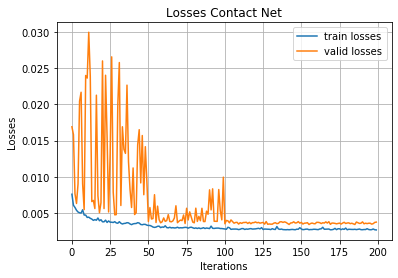

In [11]:
from tqdm.notebook import tqdm
## Contact Model
train_losses = []
valid_losses = []
tl_b = []
best_loss = 9999
print(contact_model)

start = time.time()
for epoch in tqdm(range(num_epochs)):

    train_loss = 0
    contact_model.train()
    for i, samples in enumerate(dataloader_train):

        tactiles = samples['tactile'].float().to(device)
        contacts = samples['contact'].float().to(device)

        # forward pass
        output = contact_model(tactiles)

        # compute contact loss
        loss = contact_criterion(output, contacts)

        # backward pass
        contact_optimizer.zero_grad()
        loss.backward()

        # optimization
        contact_optimizer.step()

        train_loss += loss.item()
        tl_b.append(loss.item())

    train_losses.append(train_loss / datalen_train)

    valid_loss = 0
    contact_model.eval()
    with torch.no_grad():
        for i, samples in enumerate(dataloader_valid):

            tactiles = samples['tactile'].float().to(device)
            contacts = samples['contact'].float().to(device)

            # forward pass contact_model
            output = contact_model(tactiles)
            # compute contact loss
            loss = contact_criterion(output, contacts)

            valid_loss += loss.item()

    valid_losses.append(valid_loss / datalen_valid)

    # Print out training & validation loss
    print(f'Epoch {epoch}: Train = {round(train_losses[-1]*1000, 3)}; Val = {round(valid_losses[-1]*1000, 3)}')
    contact_scheduler.step()

    # save contact_model with torch.save
    if valid_loss / datalen_valid < best_loss:
        best_loss = valid_loss / datalen_valid
        torch.save(contact_model, 'contact_model.pt')
        print('\t checkpoint.')


elapse = time.time() - start
print('Time used (Sec): ', elapse, ' per epoch used: ', elapse / num_epochs)
plot_losses('Losses Contact Net', train_losses, valid_losses)

In [12]:
"""
    Apply Average 2D Convolution to filter out some "holes"
    due to lower latent space resolution
"""
def apply_avg_kernel(x, k=3):
    kernel = torch.ones((k,k))/k**2
    kernel = kernel.to(device)
    kernel = kernel.view(1, 1, k, k)
    x = F.conv2d(x, kernel, padding='same')
    return x

"""
    Utility function to predict contacts from tactiles
"""
def predict_contact(model, tactiles):
    preds = model(tactiles)
    # preds = apply_avg_kernel(preds)
    preds = (preds > 0.5).float()
    return preds

"""
    Utility function to predict contacts from tactiles
"""
def predict_depth(model, tactiles, contacts):
    preds = model(tactiles, contacts)
    # preds = apply_avg_kernel(preds)
    preds = preds * (preds > 0.005)
    return preds

torch.Size([38, 3, 256, 320]) torch.Size([38, 1, 256, 320])


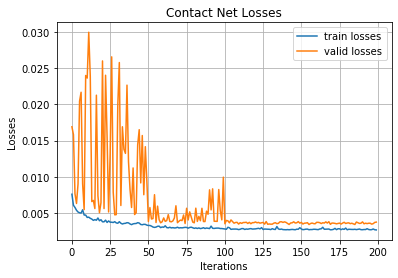

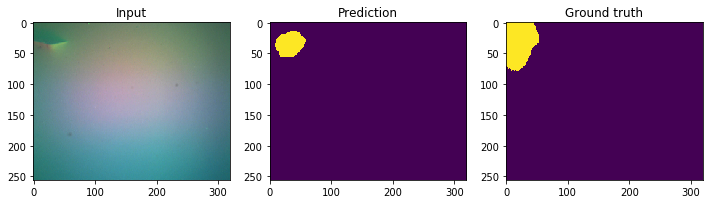

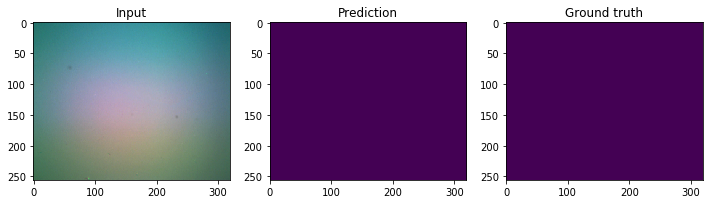

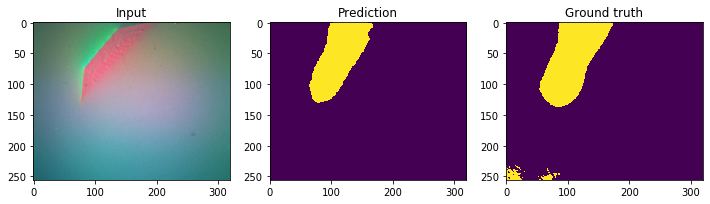

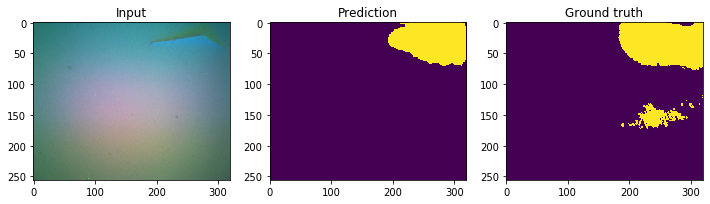

...

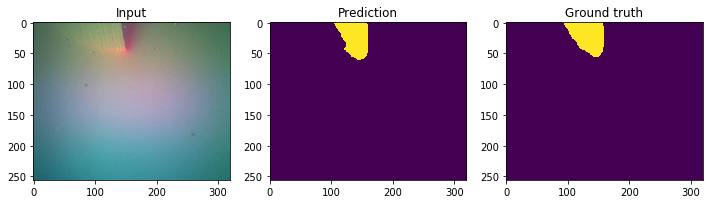

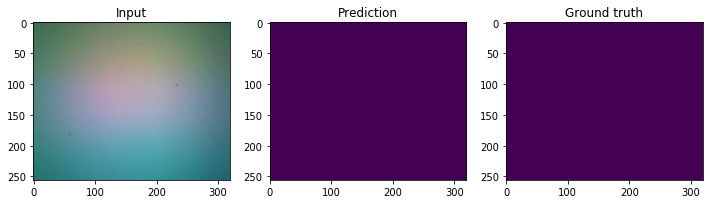

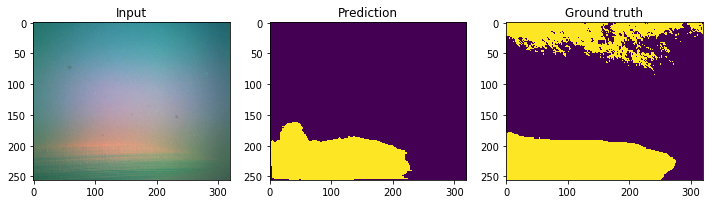

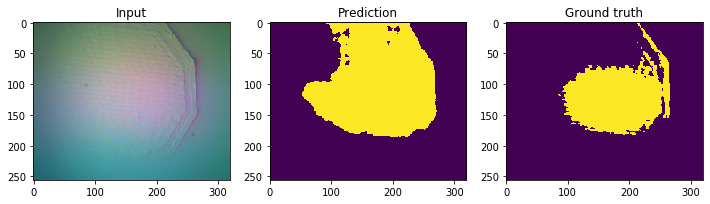

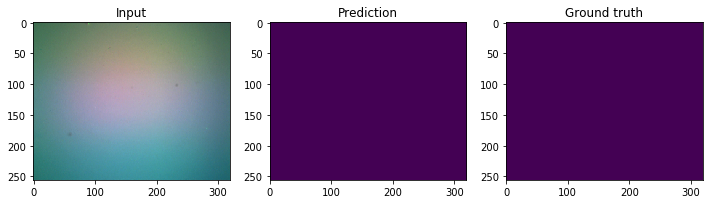

In [13]:
plot_losses('Contact Net Losses', train_losses, valid_losses)

contact_model = torch.load('contact_model.pt')
contact_model.to(device)
contact_model.eval()

for i, samples in enumerate(dataloader_valid):
    tactiles = samples['tactile'].float().to(device)
    depths = samples['depth'].float().to(device)
    contacts = samples['contact'].float().to(device)

""" Visualization of tactiles & depths for matching confirmation"""
preds = predict_contact(contact_model, tactiles)
# preds = preds > 0.5

print(tactiles.shape, depths.shape)
imgs = tactiles.detach().cpu().numpy().transpose(0,2,3,1)
preds = preds.detach().cpu().numpy().transpose(0,2,3,1)
preds = preds[:,:,:,0]
depths = depths.detach().cpu().numpy().transpose(0,2,3,1)
depths = depths[:,:,:,0]
ctacts = contacts.detach().cpu().numpy().transpose(0,2,3,1)
ctacts = ctacts[:,:,:,0]

for i in range(len(preds)):
    fig, ax = plt.subplots(ncols=3, figsize=(12,4))
    ax[0].imshow(imgs[i])
    ax[0].set_title('Input')
    ax[1].imshow(preds[i])
    ax[1].set_title('Prediction')
    ax[2].imshow(ctacts[i], vmin=0, vmax=1)
    ax[2].set_title('Ground truth')
    plt.show()

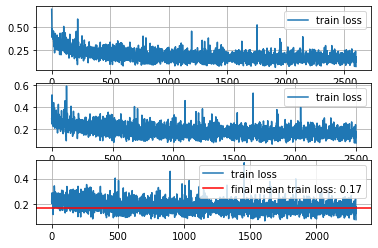

In [14]:
plt.subplot(311)
plt.plot(tl_b, label='train loss')
plt.grid(True)
plt.legend()

plt.subplot(312)
plt.plot(tl_b[100:], label='train loss')
plt.grid(True)
plt.legend()

plt.subplot(313)
plt.plot(tl_b[300:], label='train loss')
fml = np.mean(tl_b[-320:])
plt.axhline(y = fml, color='r', linestyle='-', label='final mean train loss: {:.2f}'.format(fml))
plt.grid(True)
plt.legend()

### Step 4.2: Training Depth Network

DataParallel(
  (module): TactileDepthNet(
    (unet): UNet(
      (encoder1): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (encoder2): Sequential(
        (0): LeakyReLU(negative_slope=0.2, inplace=True)
        (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (encoder3): Sequential(
        (0): LeakyReLU(negative_slope=0.2, inplace=True)
        (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (encoder4): Sequential(
        (0): LeakyReLU(negative_slope=0.2, inplace=True)
        (1): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )

> Epoch 0: Train = 51.488; Val = 10.448
	 checkpoint.
> Epoch 1: Train = 4.488; Val = 1.561
	 checkpoint.
> Epoch 2: Train = 0.772; Val = 0.752
	 checkpoint.
> Epoch 3: Train = 0.331; Val = 0.242
	 checkpoint.
> Epoch 4: Train = 0.159; Val = 0.144
	 checkpoint.
> Epoch 5: Train = 0.122; Val = 0.13
	 checkpoint.
> Epoch 6: Train = 0.108; Val = 0.115
	 checkpoint.
> Epoch 7: Train = 0.097; Val = 0.108
	 checkpoint.
> Epoch 8: Train = 0.093; Val = 0.111
> Epoch 9: Train = 0.094; Val = 0.124
> Epoch 10: Train = 0.089; Val = 0.103
	 checkpoint.
> Epoch 11: Train = 0.088; Val = 0.103
	 checkpoint.
> Epoch 12: Train = 0.089; Val = 0.092
	 checkpoint.
> Epoch 13: Train = 0.084; Val = 0.092
	 checkpoint.
> Epoch 14: Train = 0.079; Val = 0.093
> Epoch 15: Train = 0.075; Val = 0.095
> Epoch 16: Train = 0.076; Val = 0.096
> Epoch 17: Train = 0.079; Val = 0.113
> Epoch 18: Train = 0.077; Val = 0.093
> Epoch 19: Train = 0.075; Val = 0.099
> Epoch 20: Train = 0.075; Val = 0.096
> Epoch 21: Train = 0.

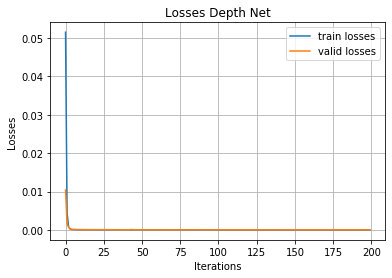

In [15]:
## Tactile Depth Model
train_losses_, valid_losses_ = [], []
tl_b_ = []
start = time.time()
best_loss_ = 99999
# depth_ckpt = 'tactile_depth_model_stackedcnn_noContact.pt'
depth_ckpt = 'tactile_depth_model.pt'
print(tactile_depth_model)

## Load trained Contact Model
contact_model = torch.load('contact_model.pt')
contact_model.to(device)
contact_model.eval()

# print('Using contact model:', tactile_depth_model.use_contact)

for epoch in tqdm(range(num_epochs)):

    print('>', end=' ')

    train_loss = 0
    tactile_depth_model.train()
    for i, samples in enumerate(dataloader_train):

        tactiles = samples['tactile'].float().to(device)
        depths = samples['depth'].float().to(device)

        # results from contact
        contacts = predict_contact(contact_model, tactiles)

        # forward pass
        preds = tactile_depth_model(tactiles, contacts)

        # backward pass
        loss = tactile_depth_criterion(preds, depths)
        tactile_depth_optimizer.zero_grad()
        loss.backward()

        # optimization
        tactile_depth_optimizer.step()

        train_loss += loss.item()
        tl_b_.append(loss.item())

    train_losses_.append(train_loss / datalen_train)

    valid_loss = 0
    tactile_depth_model.eval()
    with torch.no_grad():
        for i, samples in enumerate(dataloader_valid):

            tactiles = samples['tactile'].float().to(device)
            depths = samples['depth'].float().to(device)

            # results from tactile_depth network
            tactile_depth_model.eval()
            with torch.no_grad():
                # results from contact
                contacts = predict_contact(contact_model, tactiles)

                # forward pass tactile_depth_model
                preds = tactile_depth_model(tactiles, contacts)

                # compute loss from tactile_depth_criterion
                loss = tactile_depth_criterion(preds, depths)

                valid_loss += loss.item()

    valid_losses_.append(valid_loss / datalen_valid)

    # Print out training & validation loss
    print(f'Epoch {epoch}: Train = {round(train_losses_[-1]*1000, 3)}; Val = {round(valid_losses_[-1]*1000, 3)}')
    tactile_depth_scheduler.step()

    # save save tactile_depth_model with torch.save
    if valid_loss / datalen_valid < best_loss_:
        best_loss_ = valid_loss / datalen_valid
        torch.save(tactile_depth_model, depth_ckpt)
        print('\t checkpoint.')

elapse = time.time() - start
print('Time used (Sec): ', elapse, ' per epoch used: ', elapse / num_epochs)
plot_losses('Losses Depth Net', train_losses_, valid_losses_)

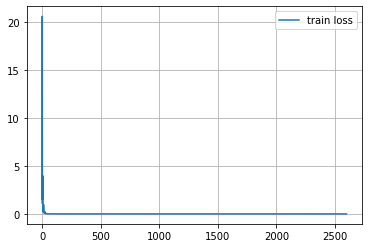

In [16]:
plt.plot(tl_b_, label='train loss')
plt.grid(True)
plt.legend()

torch.Size([38, 3, 256, 320]) torch.Size([38, 1, 256, 320])


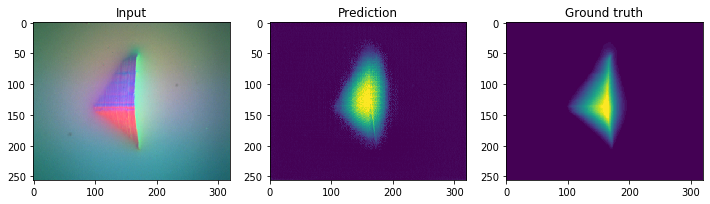

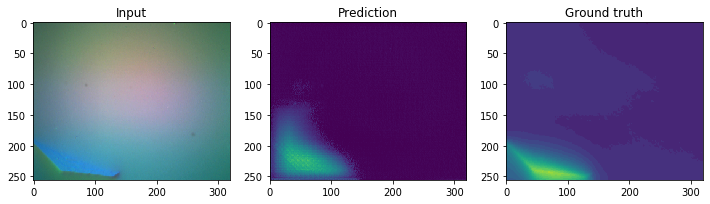

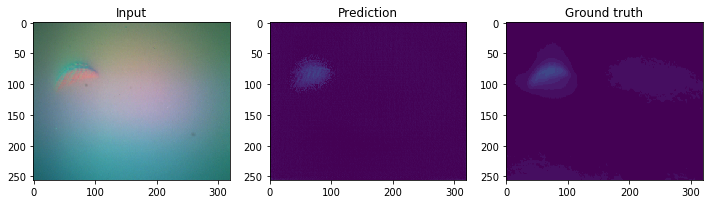

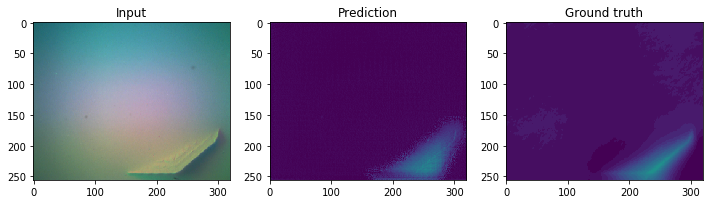

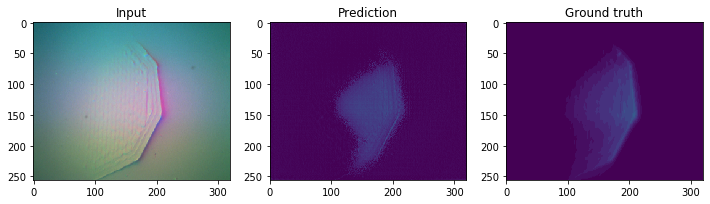

...

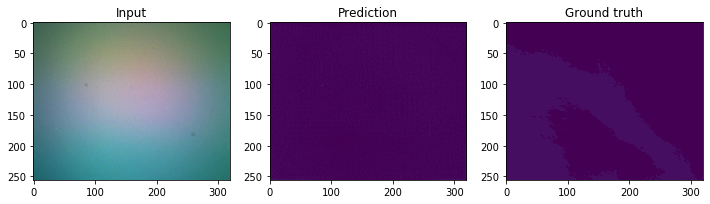

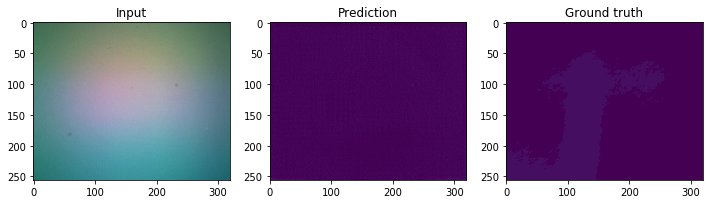

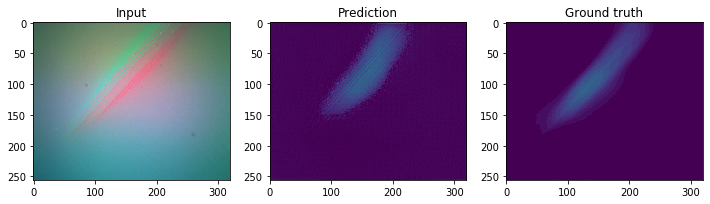

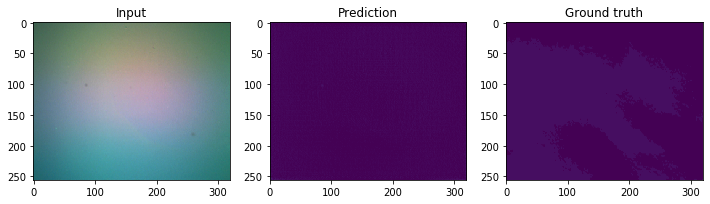

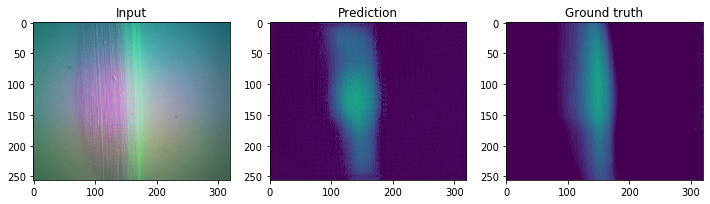

In [17]:
# plot_losses('Losses Depth Net', train_losses_[1:], valid_losses_[1:])

contact_model = torch.load('contact_model.pt')
contact_model.to(device)
contact_model.eval()

# tactile_depth_model = torch.load('tactile_depth_model.pt')
# tactile_depth_model = torch.load('tactile_depth_model_noContact.pt')
# tactile_depth_model = torch.load('tactile_depth_model_split1.pt')
tactile_depth_model = torch.load('tactile_depth_model.pt')

tactile_depth_model.to(device)
tactile_depth_model.eval()

for i, samples in enumerate(dataloader_valid):
    tactiles = samples['tactile'].float().to(device)
    depths = samples['depth'].float().to(device)

""" Visualization of tactiles & depths for matching confirmation"""
contacts = predict_contact(contact_model, tactiles)
preds = tactile_depth_model(tactiles, contacts)

print(tactiles.shape, depths.shape)
imgs = tactiles.detach().cpu().numpy().transpose(0,2,3,1)
preds = preds.detach().cpu().numpy().transpose(0,2,3,1)
preds = preds[:,:,:,0]
depths = depths.detach().cpu().numpy().transpose(0,2,3,1)
depths = depths[:,:,:,0]

for i in range(len(preds)):
    fig, ax = plt.subplots(ncols=3, figsize=(12,4))
    ax[0].imshow(imgs[i])
    ax[0].set_title('Input')
    ax[1].imshow(preds[i], vmin=0, vmax=0.11)
    ax[1].set_title('Prediction')
    ax[2].imshow(depths[i], vmin=0, vmax=0.11)
    ax[2].set_title('Ground truth')
    plt.show()

### Test Depth Model

torch.Size([64, 1, 256, 320])
torch.Size([50, 1, 256, 320])

(114, 256, 320)


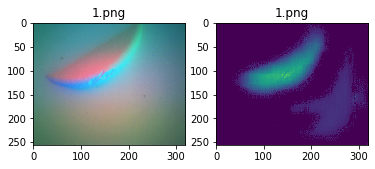

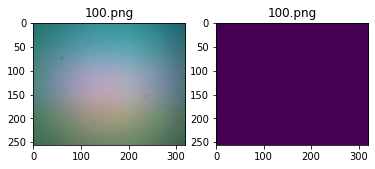

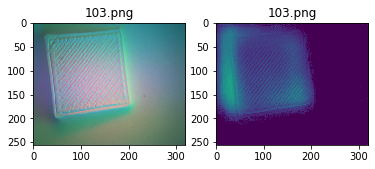

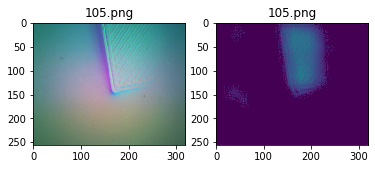

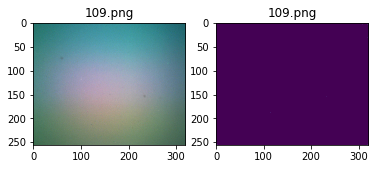

...

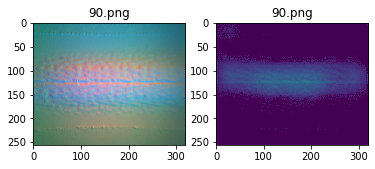

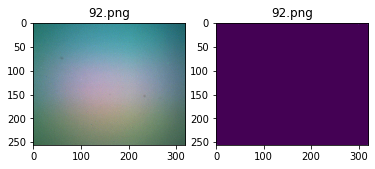

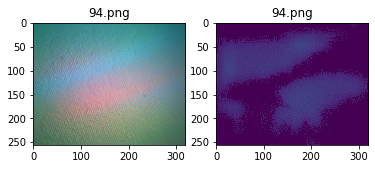

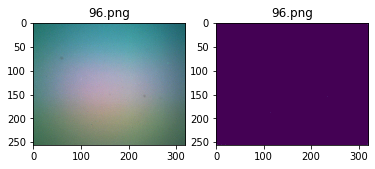

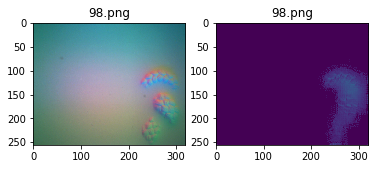

In [33]:
## Evaluation

## Load trained Contact Model
contact_model = torch.load('contact_model.pt')
contact_model.to(device)
contact_model.eval()

## Load trained Depth Model
depth_model = torch.load('tactile_depth_model.pt')
# depth_model = torch.load('tactile_depth_model_noContact.pt')
depth_model.to(device)
depth_model.eval()

# dataloader for testset
transforms_test = transforms.Compose([transforms.ToTensor(), transforms.Resize([256,320], antialias=True)])
dataset_test = TactileDataset(test_tactile_dir, test_tactile_dir, transform=transforms_test)
dataloader_test = DataLoader(dataset_test, batch_size=bs, shuffle=False)

## You should evaluate multiple error and accuracy metrics that are used for depth estimation. Some of them are mentioned in Section 4.3 in https://arxiv.org/pdf/1406.2283.pdf
inputs = []
outputs = []
for i, samples in tqdm(enumerate(dataloader_test)):
    tactiles = samples['tactile'].float().to(device)

    # results from contact network
    contact_model.eval()
    with torch.no_grad():
        contact_output = predict_contact(contact_model, tactiles)

    # results from tactile depth network
    tactile_depth_model.eval()
    with torch.no_grad():
        tactile_depth_output = predict_depth(tactile_depth_model, tactiles, contact_output)
        
    print(tactile_depth_output.shape)
    
    tactiles = tactiles.detach().cpu().numpy()
    tactiles = np.transpose(tactiles, (0,2,3,1))
    inputs.append(tactiles)
    
    tactile_depth_output = tactile_depth_output.detach().cpu().numpy()
    tactile_depth_output = tactile_depth_output.squeeze(1)
    outputs.append(tactile_depth_output)

"""===================================================== 
    # Save predicted depth on test set 
====================================================="""
from skimage.transform import resize

# show 10 sample images (from both the train and test sets) in a subplot figure. Each row should represent a tactile image, and there should be three columns: the original image, the predicted depth, and the predicted contact.
inputs = np.concatenate(inputs, axis=0)
outputs = np.concatenate(outputs, axis=0)
outputs = np.clip(outputs, 0, 1)
print(outputs.shape)

test_img_names = sorted(os.listdir(test_tactile_dir))
for i in range(0, len(outputs), len(outputs)//40):
    img_name = test_img_names[i]
    
    fig, ax = plt.subplots(ncols=2)
    ax[0].set_title(img_name)
    ax[0].imshow(inputs[i])
    ax[1].set_title(img_name)
    ax[1].imshow(outputs[i], vmin=0, vmax=0.11)
    plt.show()

### Save predicted depth as images in folder

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


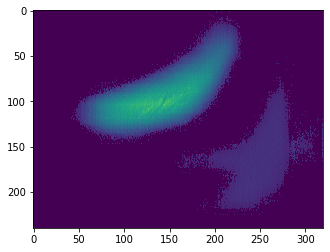

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


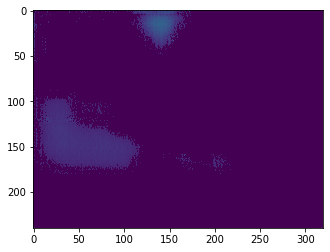

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


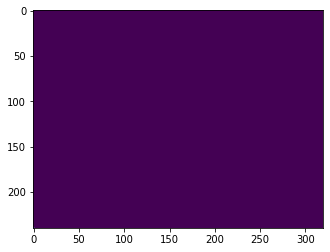

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


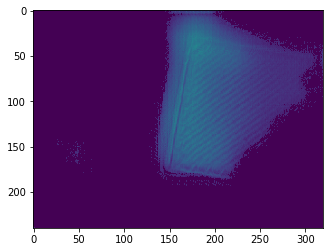

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


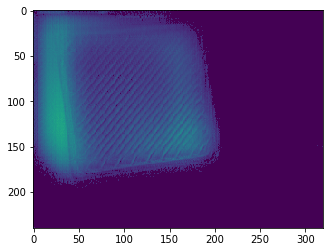

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


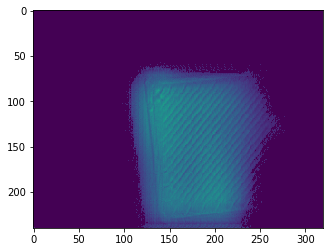

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


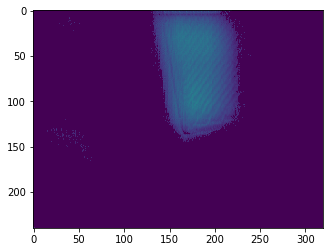

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


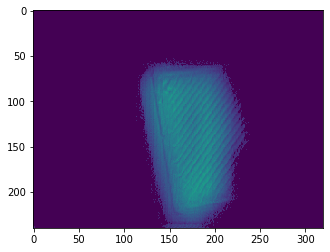

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


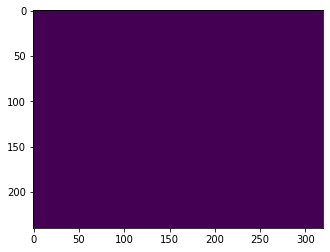

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


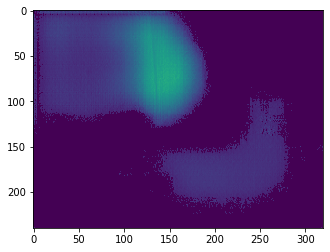

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


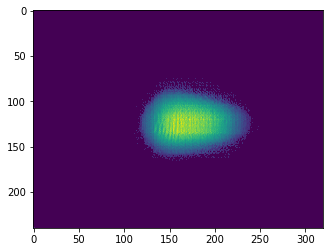

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


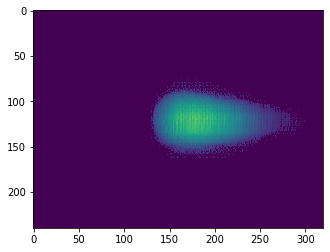

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


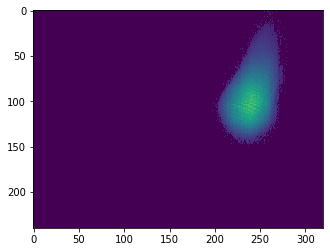

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


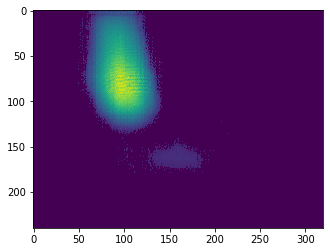

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


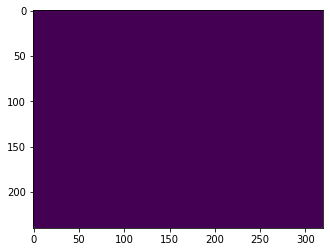

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


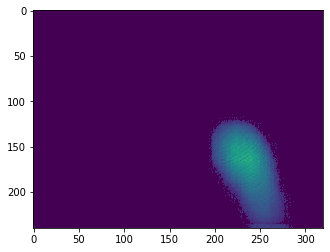

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


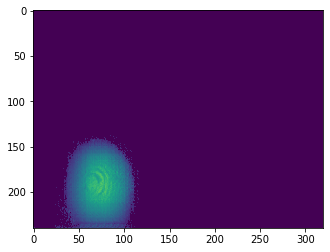

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


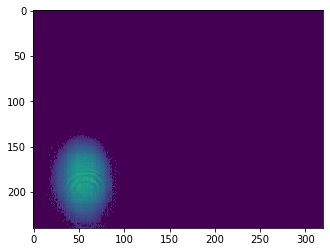

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


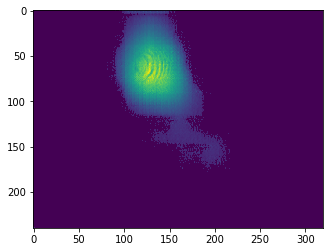

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


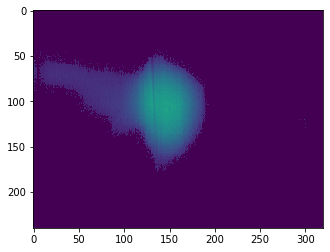

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


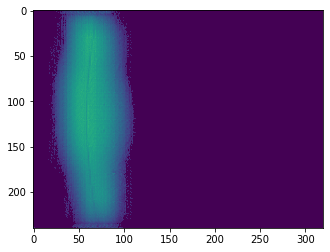

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


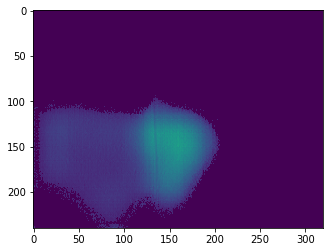

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


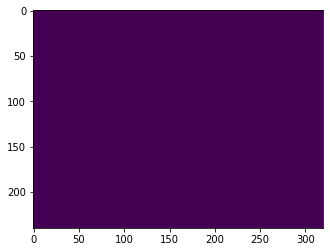

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


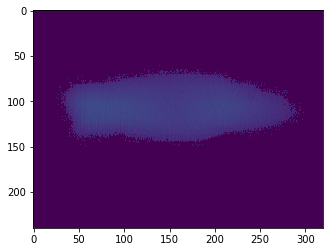

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


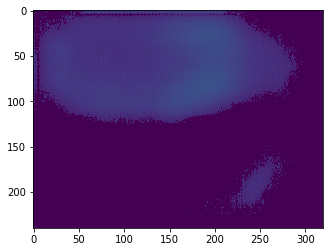

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


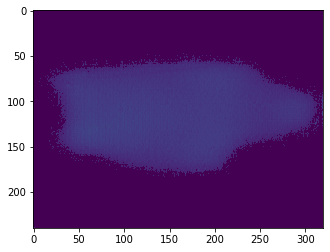

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


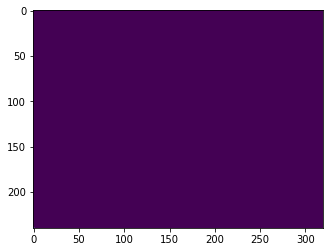

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


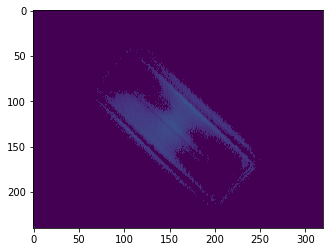

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


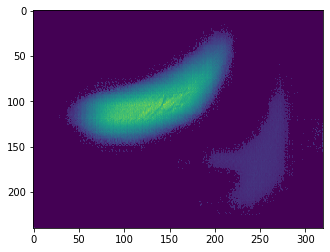

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


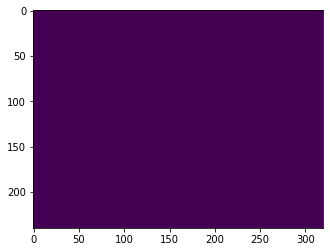

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


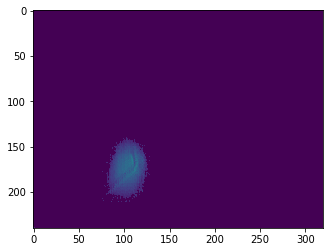

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


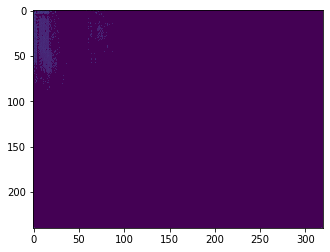

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


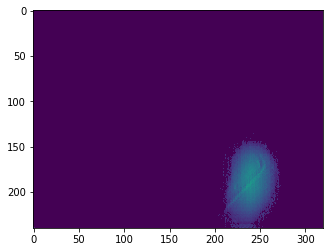

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


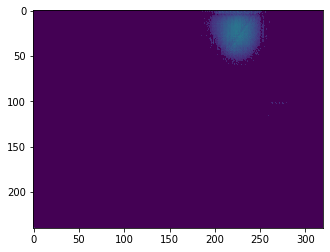

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


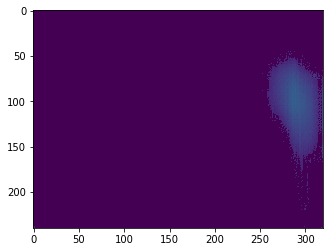

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


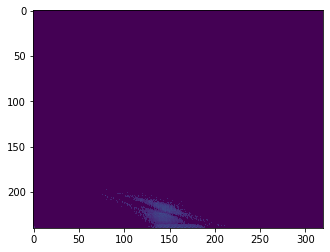

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


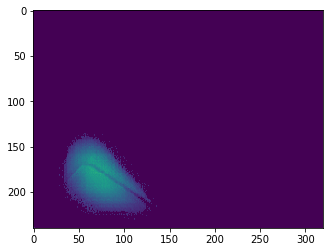

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


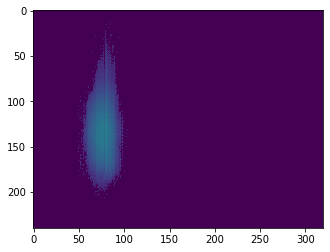

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


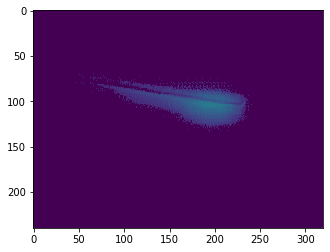

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


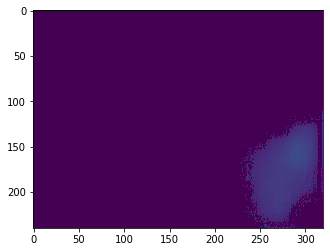

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


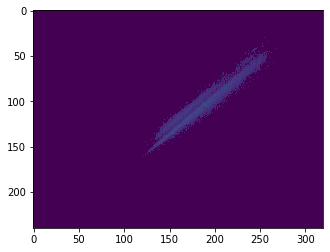

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


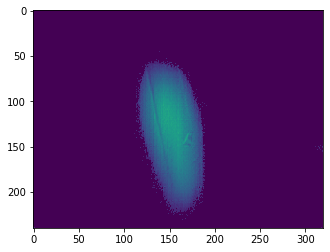

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


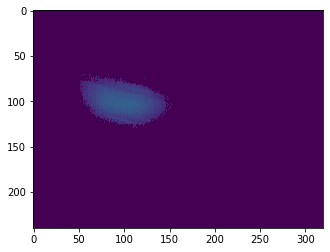

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


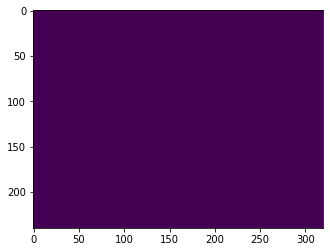

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


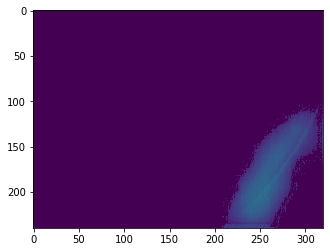

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


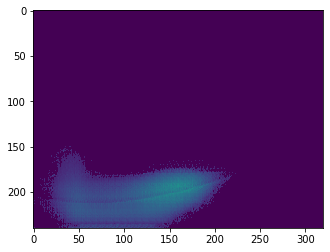

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


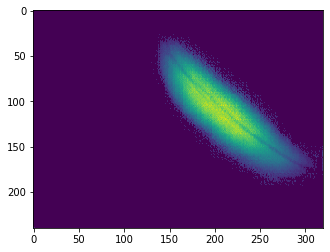

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


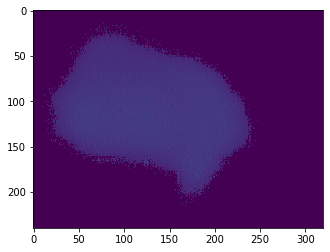

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


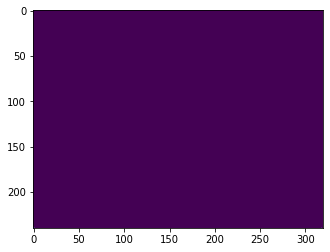

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


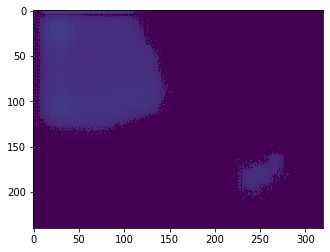

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


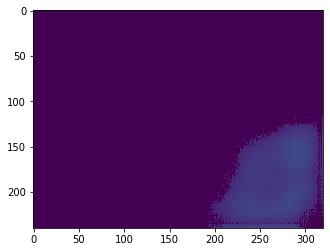

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


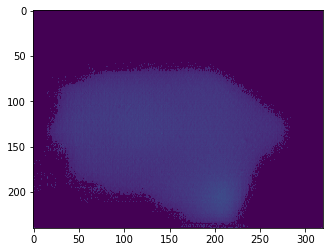

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


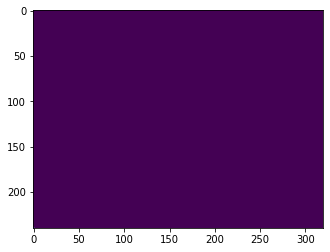

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


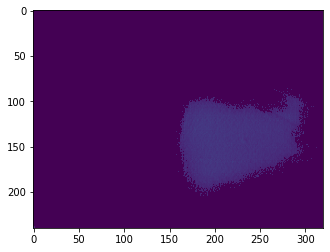

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


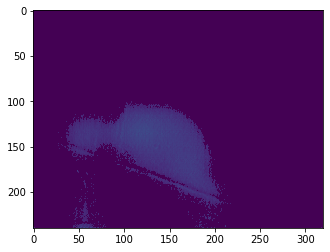

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


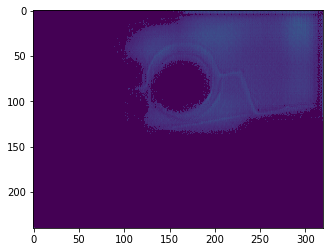

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


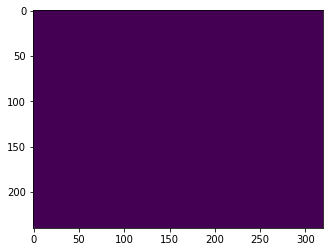

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


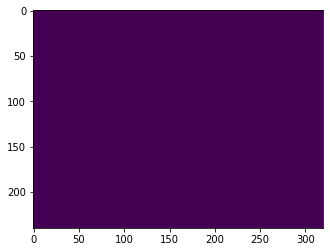

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


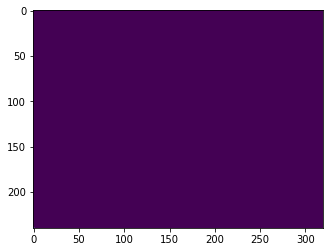

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


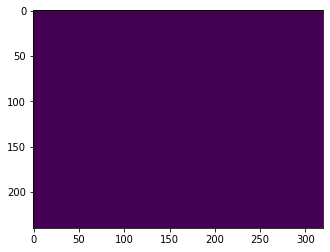

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


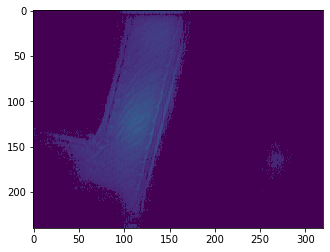

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


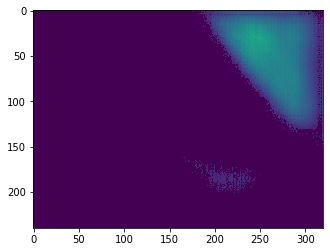

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


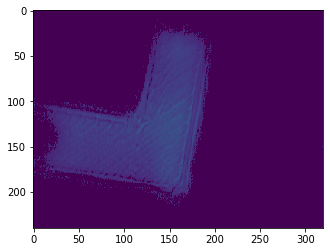

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


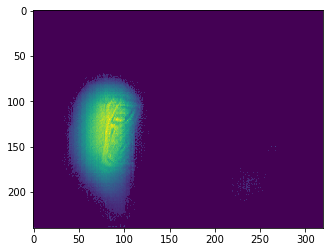

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


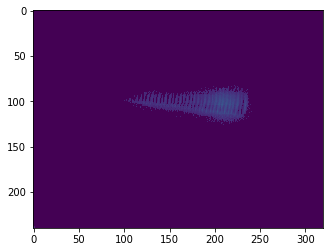

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


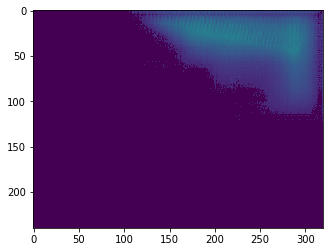

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


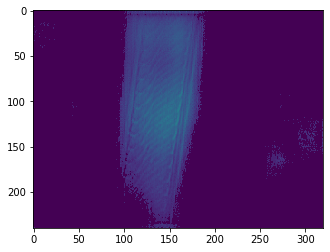

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


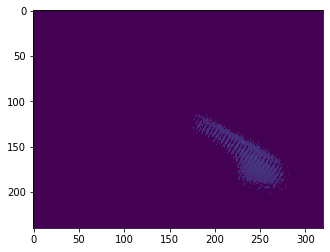

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


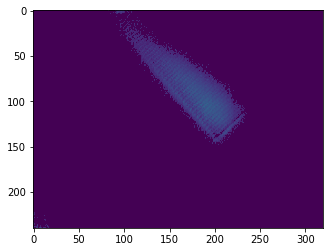

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


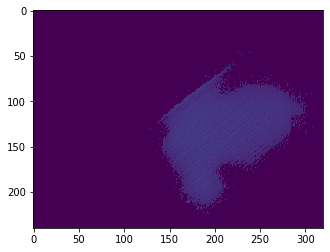

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


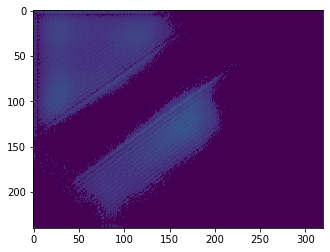

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


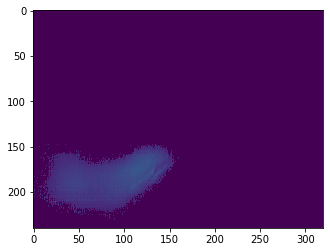

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


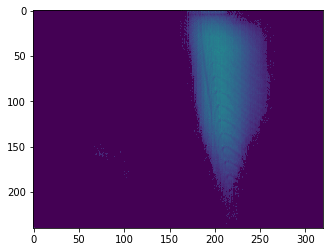

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


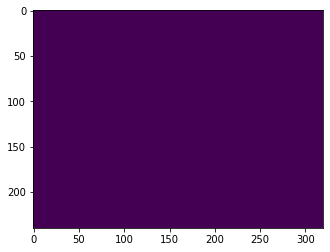

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


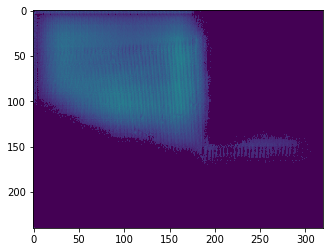

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


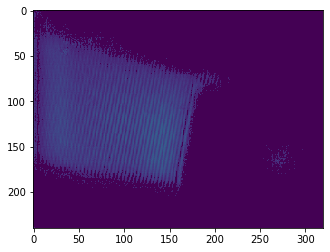

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


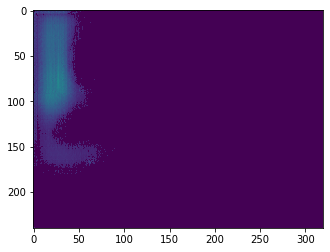

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


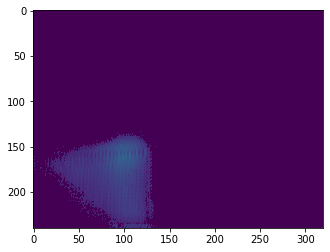

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


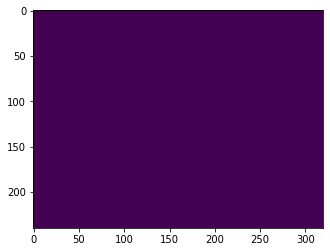

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


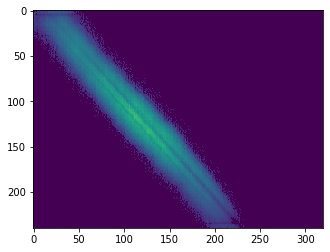

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


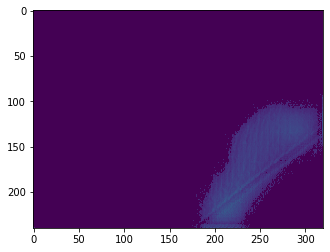

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


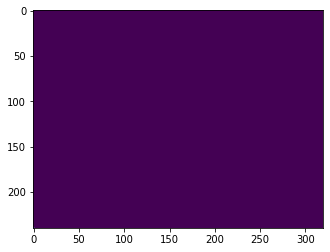

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


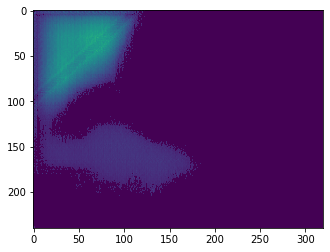

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


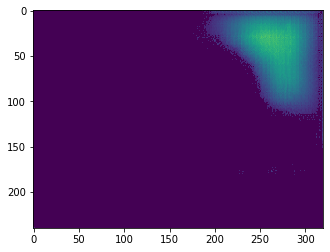

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


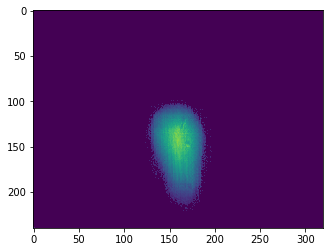

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


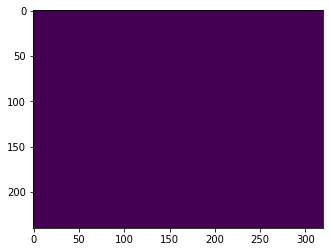

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


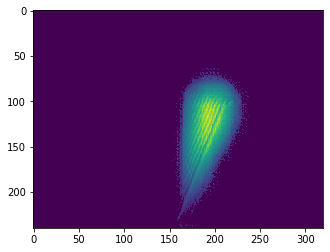

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


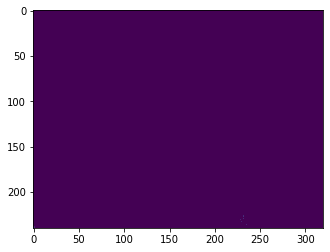

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


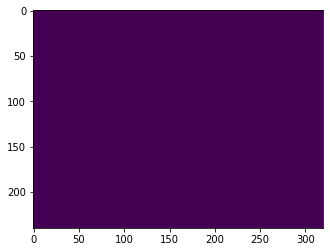

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


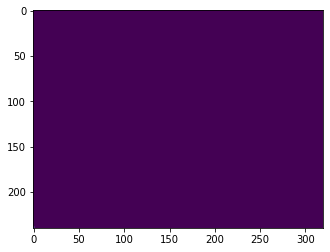

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


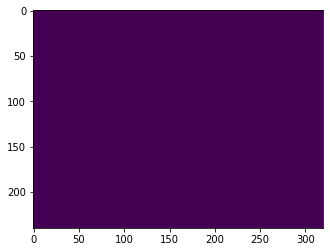

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


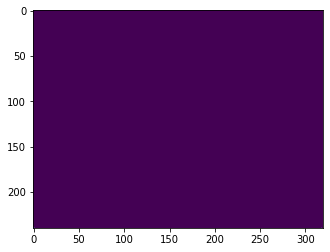

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


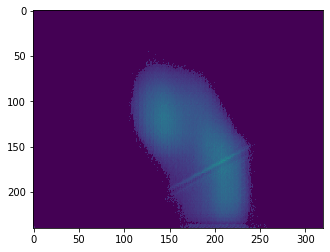

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


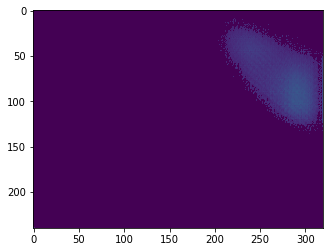

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


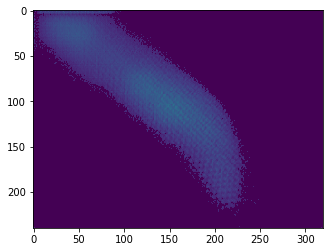

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


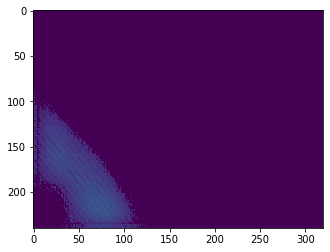

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


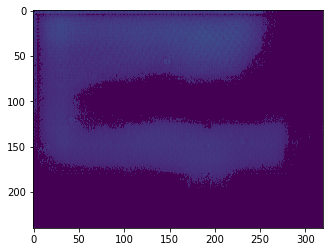

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


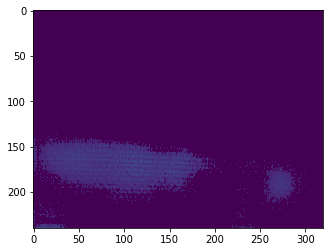

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


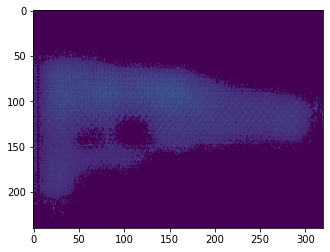

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


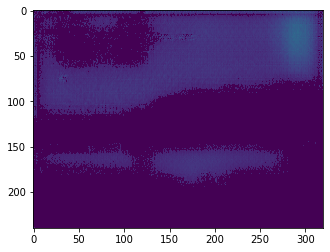

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


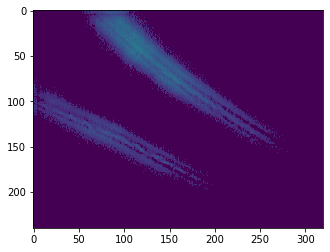

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


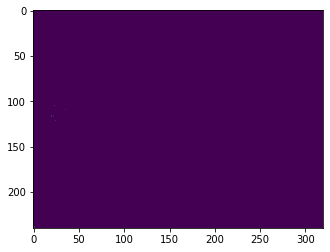

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


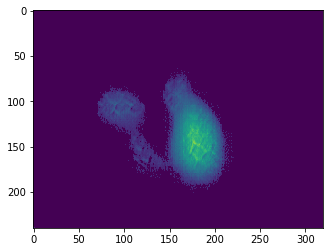

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


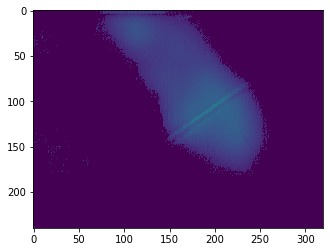

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


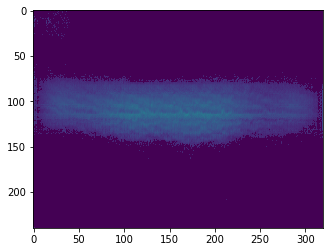

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


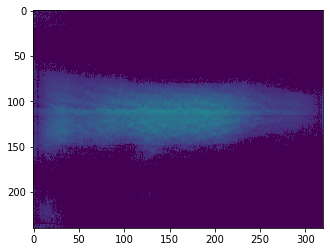

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


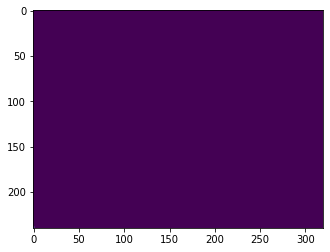

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


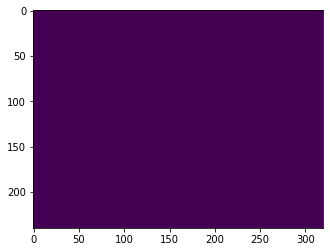

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


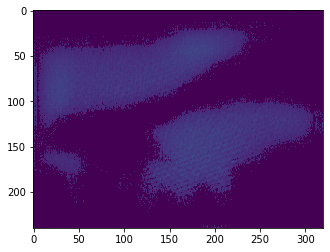

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


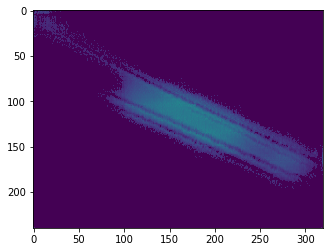

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


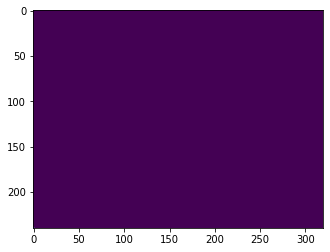

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


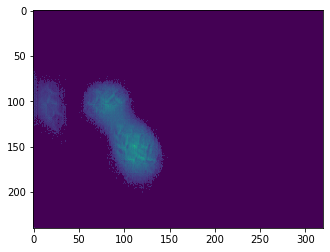

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


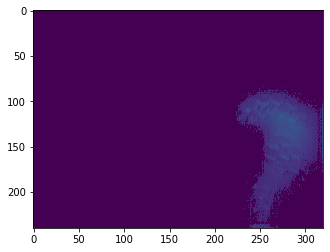

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


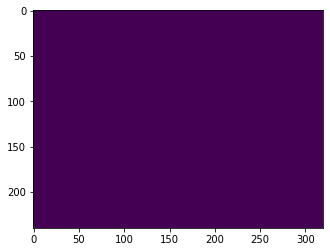

In [34]:
# save predicted depths
import imageio

folder_name = 'depth_test'
os.system(f'rm -r submission/{folder_name}')
os.system(f'mkdir -p submission/{folder_name}')
for i, img in tqdm(enumerate(outputs)):
    img_name = test_img_names[i]
    img = resize(img, (240,320))
    img = img * (img > 0.01)
    imageio.imwrite(f'submission/{folder_name}/{img_name}', img)
    plt.imshow(img, vmin=0, vmax=0.11)
    plt.show()

### Run prediction on the Image on Piazza

torch.Size([1, 1, 256, 320])



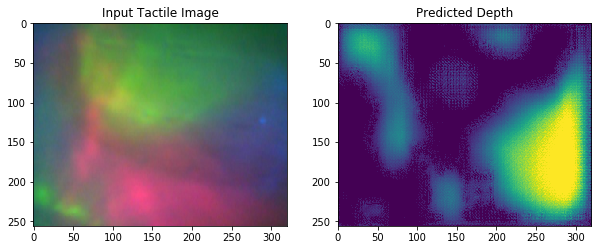

In [35]:
""" Consider the image as 1-image dataset"""
test_piazza_dir = 'test_image_piazza'
dataset_test = TactileDataset(test_piazza_dir, test_piazza_dir, transform=transforms_test)
dataloader_test = DataLoader(dataset_test, batch_size=bs, shuffle=False)

""" Run inference on the image"""
## You should evaluate multiple error and accuracy metrics that are used for depth estimation. Some of them are mentioned in Section 4.3 in https://arxiv.org/pdf/1406.2283.pdf
inputs = []
outputs = []
for i, samples in tqdm(enumerate(dataloader_test)):
    tactiles = samples['tactile'].float().to(device)

    # results from contact network
    contact_model.eval()
    with torch.no_grad():
        contact_output = predict_contact(contact_model, tactiles)

    # results from tactile depth network
    tactile_depth_model.eval()
    with torch.no_grad():
        tactile_depth_output = predict_depth(tactile_depth_model, tactiles, contact_output)
        
    print(tactile_depth_output.shape)
    
    tactiles = tactiles.detach().cpu().numpy()
    tactiles = np.transpose(tactiles, (0,2,3,1))
    inputs.append(tactiles)
    
    tactile_depth_output = tactile_depth_output.detach().cpu().numpy()
    tactile_depth_output = tactile_depth_output.squeeze(1)
    outputs.append(tactile_depth_output)
    
""" Get the predicted image"""
inputs = np.concatenate(inputs, axis=0)
outputs = np.concatenate(outputs, axis=0)
outputs = np.clip(outputs, 0, 1)
img = outputs[0]
img = resize(img, (240,320))
img = img * (img > 0.01)
img = resize(img, (240,320))
img = img * (img > 0.01)

""" Display the image"""
fig, ax = plt.subplots(ncols=2, figsize=(10,10))
ax[0].set_title('Input Tactile Image')
ax[0].imshow(inputs[i])
ax[1].set_title('Predicted Depth')
ax[1].imshow(outputs[i], vmin=0, vmax=0.11)
plt.show()

### Define a function below that instantializes the networks again and loads the weights for new predictions. This function will be used for testing purposes.

In [36]:
def predict(tactile_image):
    ## Load trained Contact Model
    contact_model = torch.load('contact_model.pt')
    contact_model.to(device)
    contact_model.eval()

    ## Load trained Depth Model
    depth_model = torch.load('tactile_depth_model.pt')
    depth_model.to(device)
    depth_model.eval()
    
    with torch.no_grad():
        contact_output = predict_contact(contact_model, tactile_image)
        tactile_depth_output = tactile_depth_model(tactiles, contact_output)
        
    contact = contact_output.detach().cpu().numpy().squeeze(1)
    depth = tactile_depth_output.detach().cpu().numpy().squeeze(1)

    return contact, depth

In [37]:
from PIL import Image
import numpy as np

class Predictor:
    def __init__(self):
        self.dir = "submission/depth"
        self.n = 320
        self.m = 240
        
    def predict(self, i):
        return np.asarray(Image.open(f"{i}.png"))

**Grading Criteria:**


Every group is required to present(in 10 mins) their project in-person to a TA. Grading will be based on the performance on unseen data. Therefore, your choice of data augmentations, network design, loss function etc., will be crucial aspects to focus on. You should also upload a LaTeX report about the experiments you had in [this](https://www.overleaf.com/latex/templates/cvpr-2022-author-kit/qbmjsdxryffn) template.

Refrences:

[1] [Depth Map Prediction from a Single Image
using a Multi-Scale Deep Network](https://arxiv.org/pdf/1406.2283.pdf)

[2] [MidasTouch: Monte-Carlo inference over
distributions across sliding touch](https://arxiv.org/pdf/2210.14210.pdf)

[3] [depth-eigen](https://github.com/shuuchen/depth_eigen/tree/master)
